## Easigenomics clustering

- In this notebook only NK cells are selected for analysis
- NK cell cluster was defined in notebook: Easi_subset_clustering.ipynb 
- Cluster was defined from RNA map, cluster 9 represents NK cells (leiden resolution = 1) 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scanpy as sc
import umap
from pySankey import sankey

import warnings

warnings.filterwarnings('ignore')

/research/users/tiinajt/miniconda3/envs/tiina-env2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#Retrieve the object

adata = ad.read_h5ad('/research/groups/sysgen/PROJECTS/scHEMAP/tiina_work/Easigenomics_subset_final.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 58674 × 32738
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1', 'leiden_0.5', 'leiden_1'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'BATCH_colors', 'DIAGNOSIS_colors', 'SAMPLE_CODE_colors', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_TotalVI', 'X_pca', 'X_umap', 'clr_protein_expression', 'dsb_protein_expression', 'protein_expression'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
#AA, AML and MDS samples are selected for analysis

adata.obs['DIAGNOSIS'].unique().tolist()

['Aplastic anemia', 'AML', 'MDS']

In [5]:
#Samples included to analysis

adata.obs['SAMPLE_CODE'].unique().tolist()

['EG34',
 'EG35',
 'EG36',
 'EG37',
 'EG44',
 'EG45',
 'EG46',
 'EG47',
 'EG48',
 'EG49',
 'EG50',
 'EG51',
 'EG52',
 'EG53',
 'EG54',
 'EG55',
 'EG56',
 'EG57',
 'EG58',
 'EG59',
 'EG60',
 'EG61',
 'EG62',
 'EG63']

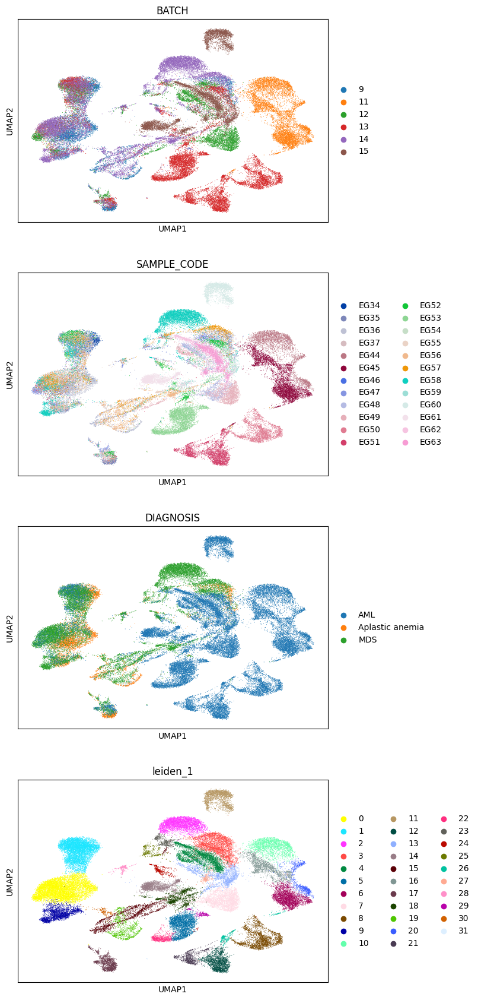

In [6]:
sc.pl.umap(adata, color = ['BATCH', 'SAMPLE_CODE', 'DIAGNOSIS', 'leiden_1'], ncols=1)

In [7]:
adata_nk = adata[(adata.obs['leiden_1'] == "9")]

In [8]:
#NK cell counts

adata_nk.shape

(2253, 32738)

In [9]:
adata_nk

View of AnnData object with n_obs × n_vars = 2253 × 32738
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1', 'leiden_0.5', 'leiden_1'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'BATCH_colors', 'DIAGNOSIS_colors', 'SAMPLE_CODE_colors', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_TotalVI', 'X_pca', 'X_umap', 'clr_protein_expression', 'dsb_protein_expression', 'protein_expression'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distan

In [10]:
#creating 3 objects

adata_rna = adata_nk.copy()
adata_latent = adata_nk.copy()
adata_prot = adata_nk.copy()

# Clustering based on RNA

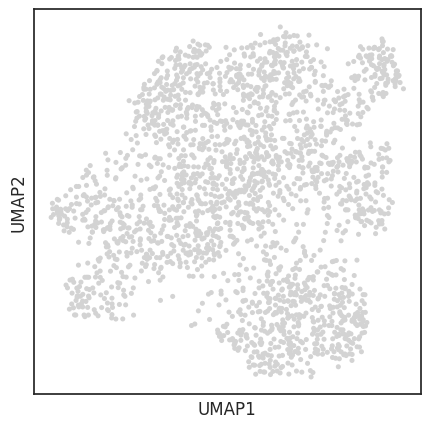

In [11]:
sns.set(style='white', rc={'figure.figsize':(5,5)})

#PCA for RNA (calculating again after subsetting the data)

sc.pp.pca(adata_rna)

#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_rna)    

sc.tl.umap(adata_rna)

sc.pl.umap(adata_rna)

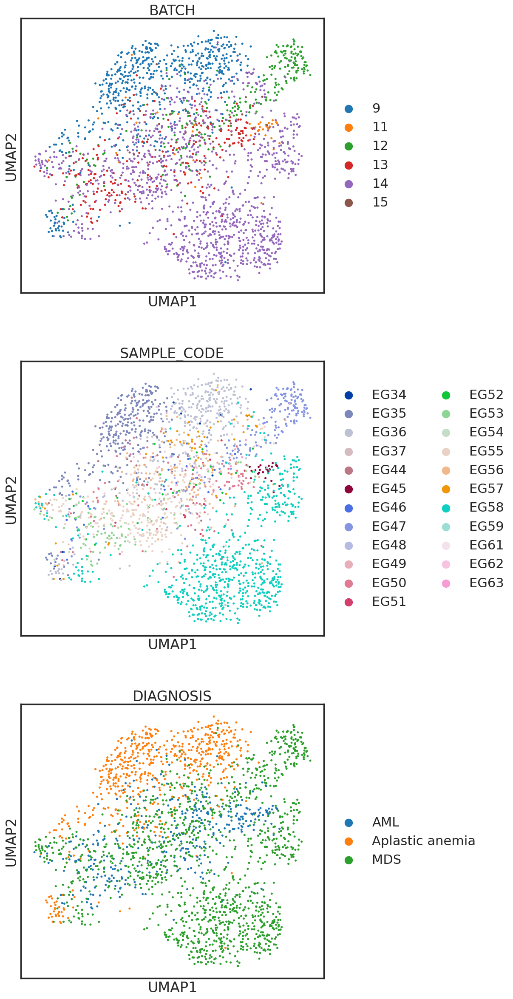

In [12]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(9,9)})

sc.pl.umap(adata_rna, color = ['BATCH', 'SAMPLE_CODE', 'DIAGNOSIS'], ncols=1)

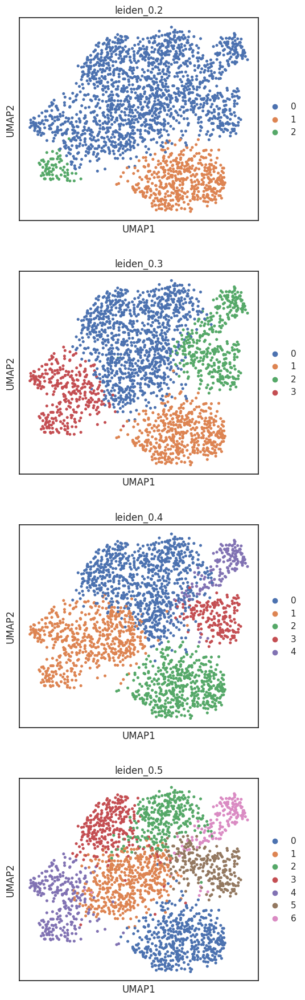

In [40]:
sns.set(style='white', rc={'figure.figsize':(5,5)})

sc.tl.leiden(adata_rna, resolution = 0.2, key_added = "leiden_0.2")
sc.tl.leiden(adata_rna, resolution = 0.3, key_added = "leiden_0.3")
sc.tl.leiden(adata_rna, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata_rna, resolution = 0.5, key_added = "leiden_0.5")

sc.pl.umap(adata_rna, color=['leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5'], ncols =1)

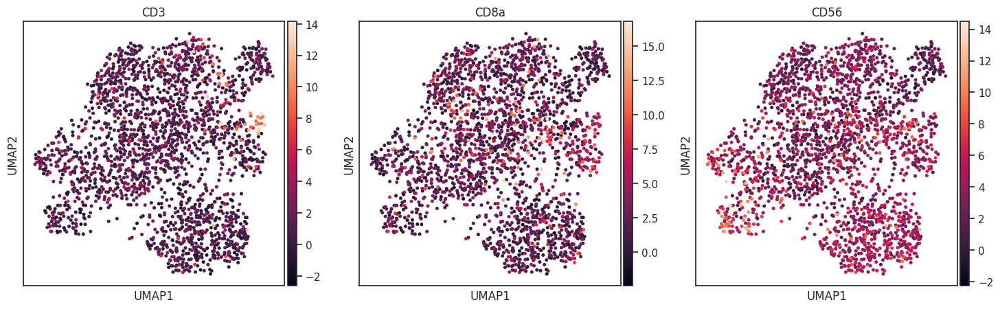

In [41]:
sc.pl.umap(adata_rna, color = ['CD3', 'CD8a', 'CD56'], ncols=4)

In [13]:
adata_prot

AnnData object with n_obs × n_vars = 2253 × 32738
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1', 'leiden_0.5', 'leiden_1'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'BATCH_colors', 'DIAGNOSIS_colors', 'SAMPLE_CODE_colors', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_TotalVI', 'X_pca', 'X_umap', 'clr_protein_expression', 'dsb_protein_expression', 'protein_expression'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

# Clustering based on latent space

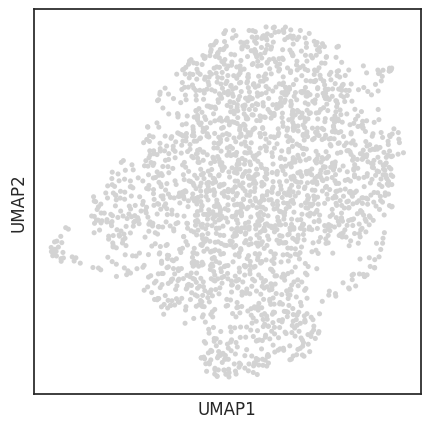

In [42]:
sns.set(style='white', rc={'figure.figsize':(5,5)})

#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_latent, use_rep = 'X_TotalVI')    

sc.tl.umap(adata_latent)

sc.pl.umap(adata_latent)

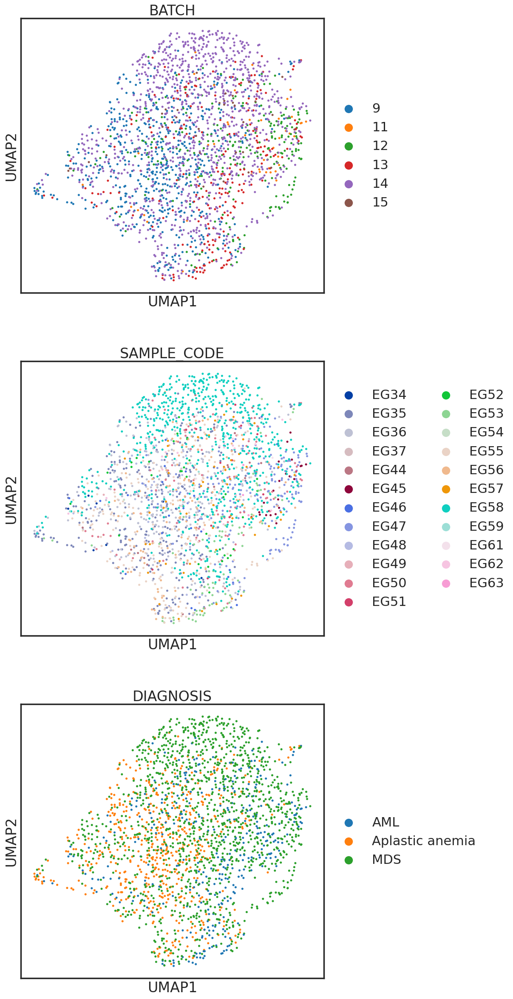

In [43]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(9,9)})

sc.pl.umap(adata_latent, color = ['BATCH', 'SAMPLE_CODE', 'DIAGNOSIS'], ncols = 1)

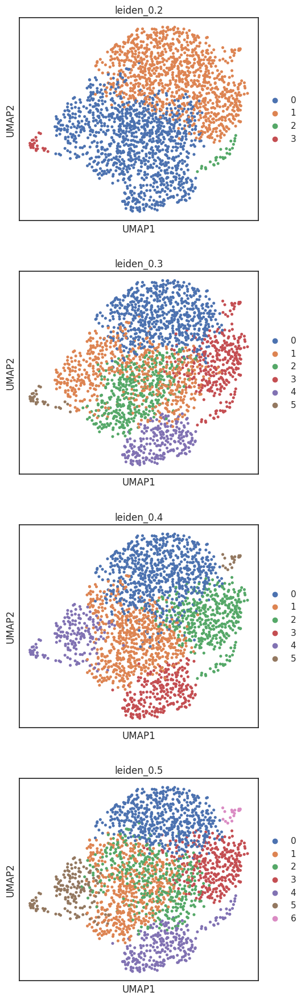

In [44]:
sns.set(style='white', rc={'figure.figsize':(5,5)})

sc.tl.leiden(adata_latent, resolution = 0.2, key_added = "leiden_0.2")
sc.tl.leiden(adata_latent, resolution = 0.3, key_added = "leiden_0.3")
sc.tl.leiden(adata_latent, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata_latent, resolution = 0.5, key_added = "leiden_0.5")

sc.pl.umap(adata_latent, color=['leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5'], ncols =1)


# Clustering based on ADT

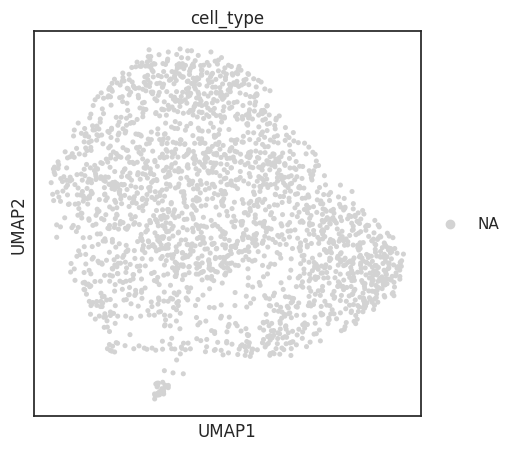

In [45]:
sns.set(style='white', rc={'figure.figsize':(5,5)})

#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_prot, use_rep = 'dsb_protein_expression')    

sc.tl.umap(adata_prot)

sc.pl.umap(adata_prot, color = ['cell_type'])

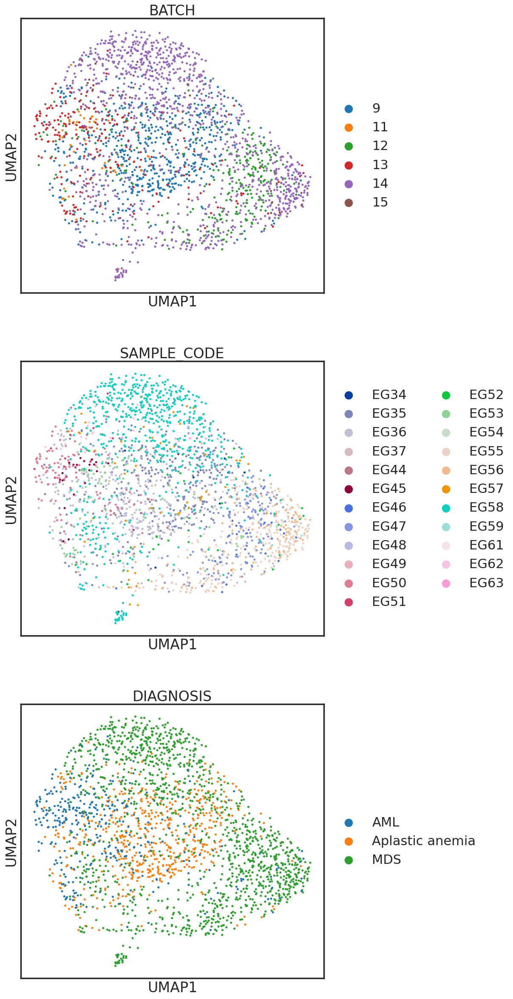

In [46]:
sns.set(style='white',  context='poster', rc={'figure.figsize':(9,9)})

sc.pl.umap(adata_prot, color = ['BATCH', 'SAMPLE_CODE', 'DIAGNOSIS'], ncols = 1)

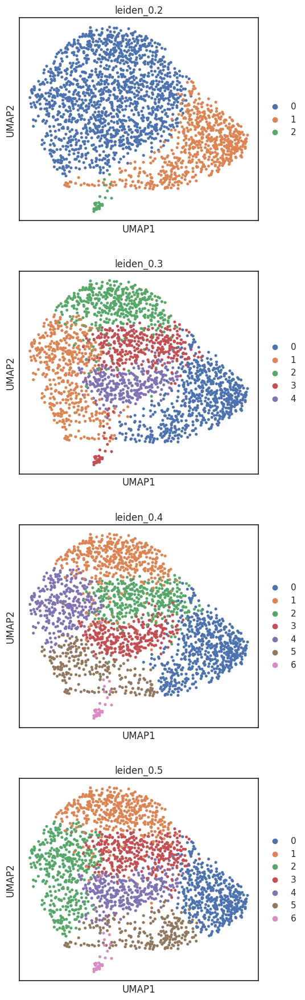

In [47]:
sns.set(style='white', rc={'figure.figsize':(5,5)})

sc.tl.leiden(adata_prot, resolution = 0.2, key_added = "leiden_0.2")
sc.tl.leiden(adata_prot, resolution = 0.3, key_added = "leiden_0.3")
sc.tl.leiden(adata_prot, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata_prot, resolution = 0.5, key_added = "leiden_0.5")

sc.pl.umap(adata_prot, color=['leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5'], ncols =1)

### Comparing clustering results of each modality

In [57]:
colors={"0":'#4c72b0', "1":'#dd8452', "2":'#55a868', "3":'#c44e52', "4":'#8172b3', "5":'#937860', "6":'#da8bc3'}

In [61]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, vector_friendly=True)


RNA vs LATENT


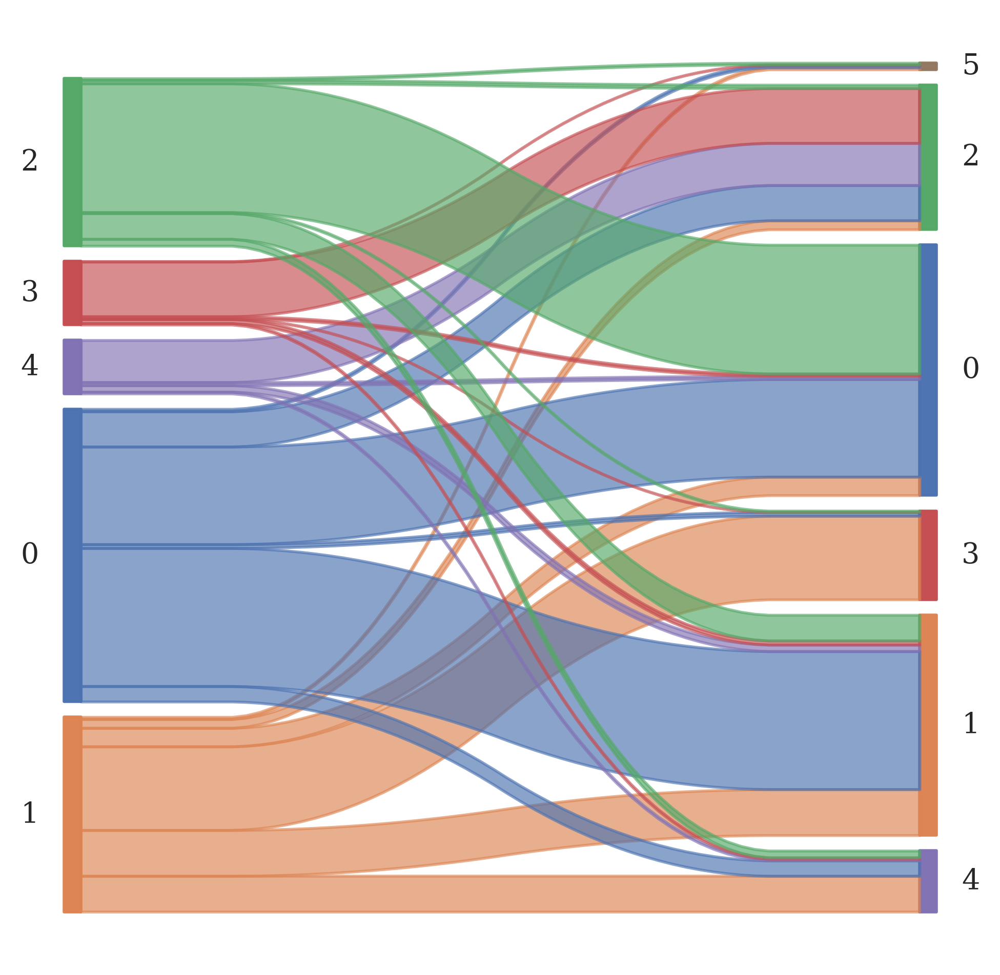

In [65]:
print("RNA vs LATENT")

sankey.sankey(adata_rna.obs['leiden_0.4'], adata_latent.obs['leiden_0.4'], colorDict=colors, aspect=20, fontsize=10)

PROT vs LATENT


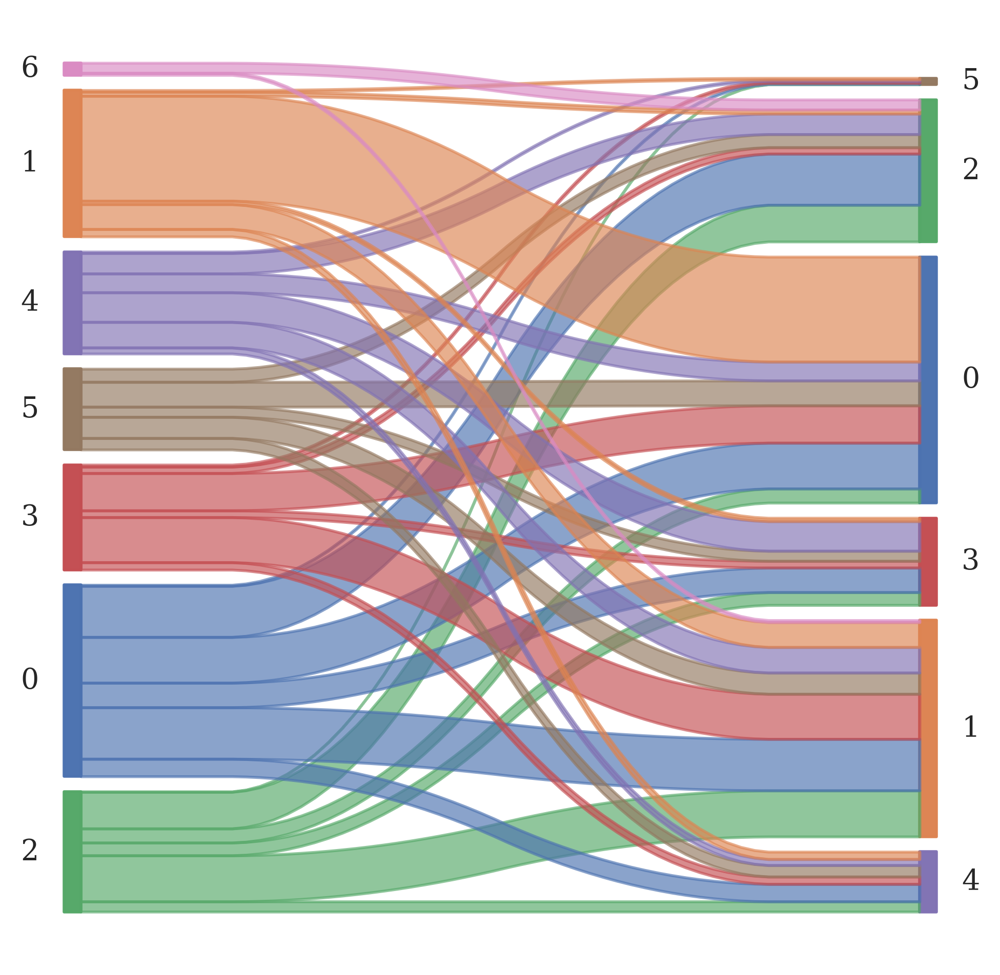

In [66]:
print("PROT vs LATENT")
 
sankey.sankey(adata_prot.obs['leiden_0.4'], adata_latent.obs['leiden_0.4'], colorDict=colors, aspect=20, fontsize=10)

RNA vs PROT


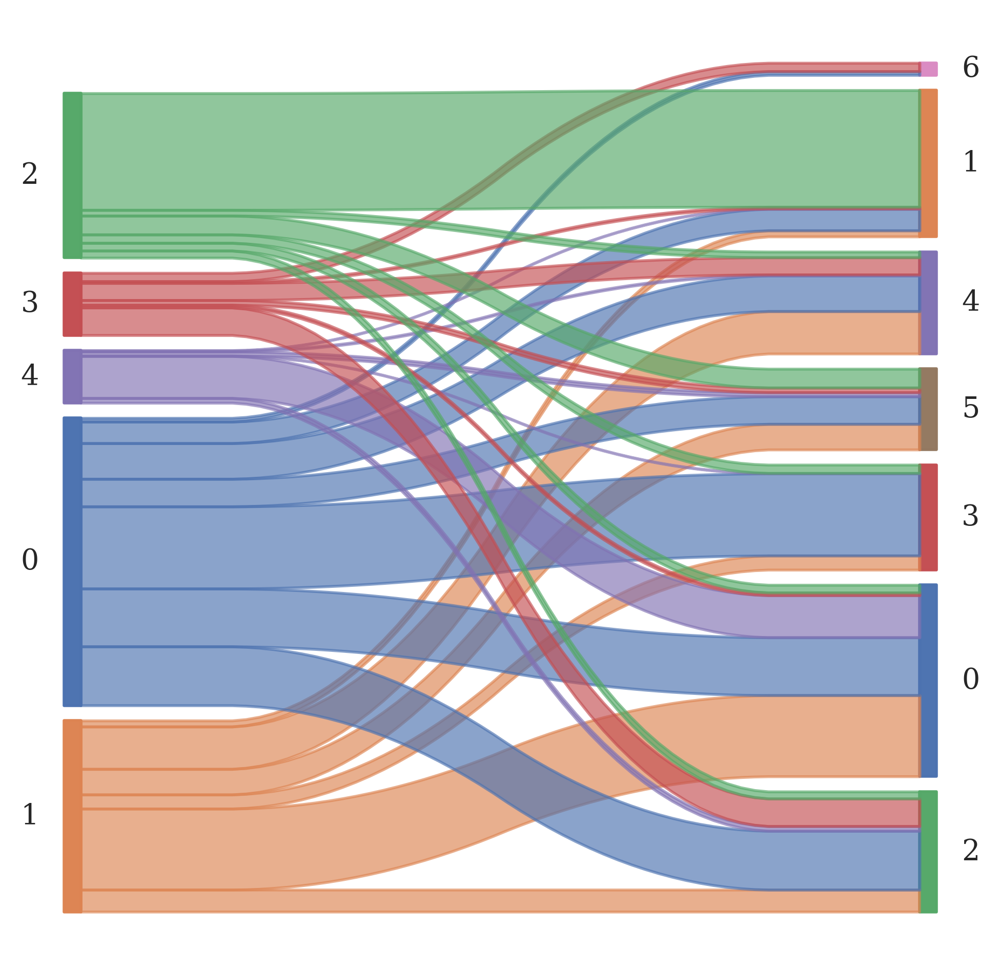

In [67]:
print("RNA vs PROT")

sankey.sankey(adata_rna.obs['leiden_0.4'], adata_prot.obs['leiden_0.4'], colorDict=colors, aspect=20, fontsize=10)